[![Binder](https://mybinder.org/badge_logo.svg)](https://nbviewer.org/github/vicente-gonzalez-ruiz/motion_estimation/blob/main/src/motion_estimation/full_search_dense_ME.ipynb)

[![Colab](https://badgen.net/badge/Launch/on%20Google%20Colab/blue?icon=notebook)](https://colab.research.google.com/github/vicente-gonzalez-ruiz/motion_estimation/blob/main/src/motion_estimation/full_search_dense_ME.ipynb)

# Image denoising using OF

The algorithm is:

0. denoised_image = noisy_image
1. for:
1.1. randomized_noisy_image = randomize_image(denoised_image)
1.2. OF_compensated_randomized_noisy_image = project_A_to_B(A=randomized_noisy_image, B=noisy_image)
1.3. denoised_image = (denoised_image + OF_compensated_randomized_noisy_image)/2

In [1]:
try:
    import google.colab
    IN_COLAB = True
except:
    IN_COLAB = False

if IN_COLAB:
    !apt update
    !apt install imagemagick
    !apt install cm-super
    !apt install dvipng
    !apt install bc
    !apt install texlive-latex-extra
    !apt install texlive-fonts-recommended

In [2]:
!which python

/shared/PEs/MP/bin/python


In [3]:
!pip install --upgrade pip

  Using cached pip-23.1.2-py3-none-any.whl (2.1 MB)
  Attempting uninstall: pip
    Found existing installation: pip 22.0.2
    Uninstalling pip-22.0.2:
      Successfully uninstalled pip-22.0.2


In [4]:
try:
    import numpy as np
except:
    !pip install numpy
    import numpy as np

try:
    from scipy import ndimage
except:
    !pip install scipy
    from scipy import ndimage

In [5]:
try:
    import matplotlib
    import matplotlib.pyplot as plt
    import matplotlib.axes as ax
    import pylab
except:
    !pip install matplotlib
    import matplotlib
    import matplotlib.pyplot as plt
    import matplotlib.axes as ax
    import pylab

plt.rcParams["text.usetex"] = True
plt.rcParams["text.latex.preamble"] = r"\usepackage{amsmath}" #for \text command
   
%matplotlib inline

  Using cached matplotlib-3.7.1-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (11.6 MB)
  Using cached contourpy-1.0.7-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (300 kB)
  Using cached cycler-0.11.0-py3-none-any.whl (6.4 kB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 10.6 MB/s eta 0:00:00MB/s eta 0:00:01:01
  Using cached kiwisolver-1.4.4-cp310-cp310-manylinux_2_12_x86_64.manylinux2010_x86_64.whl (1.6 MB)
  Using cached pyparsing-3.0.9-py3-none-any.whl (98 kB)


In [6]:
try:
    from color_transforms import YCoCg as YUV
except:
    !pip install "color_transforms @ git+https://github.com/vicente-gonzalez-ruiz/color_transforms"
    from color_transforms import YCoCg as YUV

  Cloning https://github.com/vicente-gonzalez-ruiz/color_transforms to /tmp/pip-install-gurbtghy/color-transforms_7a8b7dda21264a5b9076e6d24b40f330
  Running command git clone --filter=blob:none --quiet https://github.com/vicente-gonzalez-ruiz/color_transforms /tmp/pip-install-gurbtghy/color-transforms_7a8b7dda21264a5b9076e6d24b40f330
  Resolved https://github.com/vicente-gonzalez-ruiz/color_transforms to commit 8dcb71d015db080c1053ea654f528e5ebac32122
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for color_transforms: filename=color_transforms-0.0.1-py3-none-any.whl size=3927 sha256=d0e634f418810b79a75e69ab0225be1d929047e053fe316d0904c5255629a578
  Stored in directory: /tmp/pip-ephem-wheel-cache-hh6jx65e/wheels/23/f6/51/ae1a3f4c5165067ec91459e12edbb0db134721f90fac426d00
Successfully built color_transforms


In [7]:
try:
    from image_IO import image_1 as gray_image
    from image_IO import image_3 as RGB_image
except:
    !pip install "image_IO @ git+https://github.com/vicente-gonzalez-ruiz/image_IO"
    from image_IO import image_1 as gray_image
    from image_IO import image_3 as RGB_image

  Cloning https://github.com/vicente-gonzalez-ruiz/image_IO to /tmp/pip-install-le9p153e/image-io_11e019d4cb96450184a4af68a2b05ca2
  Running command git clone --filter=blob:none --quiet https://github.com/vicente-gonzalez-ruiz/image_IO /tmp/pip-install-le9p153e/image-io_11e019d4cb96450184a4af68a2b05ca2
  Resolved https://github.com/vicente-gonzalez-ruiz/image_IO to commit 5dff57f270436b2f3de403e9ae1eeb2ee7be5712
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
  Using cached colored-1.4.4-py3-none-any.whl
  Created wheel for image_IO: filename=image_IO-0.0.1-py3-none-any.whl size=4698 sha256=6fc2cbae2892ea1844e90a562d294286bf775f963cd2274879638ace7c912ec4
  Stored in directory: /tmp/pip-ephem-wheel-cache-e39yfgv0/wheels/20/90/b9/f15d31b7a36249b9fb7b8ab1ad46eb55e45dbdb02ab17bdb7a
Successfully built image_IO


In [8]:
try:
    from information_theory import information
    #from information_theory import distortion
except:
    !pip install "information_theory @ git+https://github.com/vicente-gonzalez-ruiz/information_theory"
    from information_theory import information
    #from information_theory import distortion

  Cloning https://github.com/vicente-gonzalez-ruiz/information_theory to /tmp/pip-install-skr569sg/information-theory_b33d641b9a2b41e0bcc2100fe647edc0
  Running command git clone --filter=blob:none --quiet https://github.com/vicente-gonzalez-ruiz/information_theory /tmp/pip-install-skr569sg/information-theory_b33d641b9a2b41e0bcc2100fe647edc0
  Resolved https://github.com/vicente-gonzalez-ruiz/information_theory to commit 0ba43976f005bab6b3849c46a5001ae25e4ed86c
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for information_theory: filename=information_theory-0.0.1-py3-none-any.whl size=3083 sha256=58018c933d8713a96c9ec694cdc3b344b3662c5226dca00daa9f00bbb77227bb
  Stored in directory: /tmp/pip-ephem-wheel-cache-w1rq4xad/wheels/a5/a2/ed/ba50f68c39cb4dbb3c5bf9d1428315e429d1bb7a90eff9caf2
Successfully built information_theory


In [9]:
try:
    import full_search
    import display
    import prediction
except:
    !pip install "motion_estimation @ git+https://github.com/vicente-gonzalez-ruiz/motion_estimation"
    from motion_estimation import optical_flow as motion
    from motion_estimation import display
    from motion_estimation import prediction

extension mode = 1


In [10]:
%%bash
if [ -d "$HOME/repos" ]; then
    echo "\"$HOME/repos\" exists"
else
    mkdir ~/repos
    echo Created $HOME/repos
fi

"/home/vruiz/repos" exists


In [11]:
import numpy as np
import cv2
import random

[image_3.py:87 print_stats() INFO] component=0 max=255 min=54 avg=180.22401428222656
[image_3.py:87 print_stats() INFO] component=1 max=248 min=1 avg=99.05646133422852
[image_3.py:87 print_stats() INFO] component=2 max=239 min=8 avg=105.41263198852539


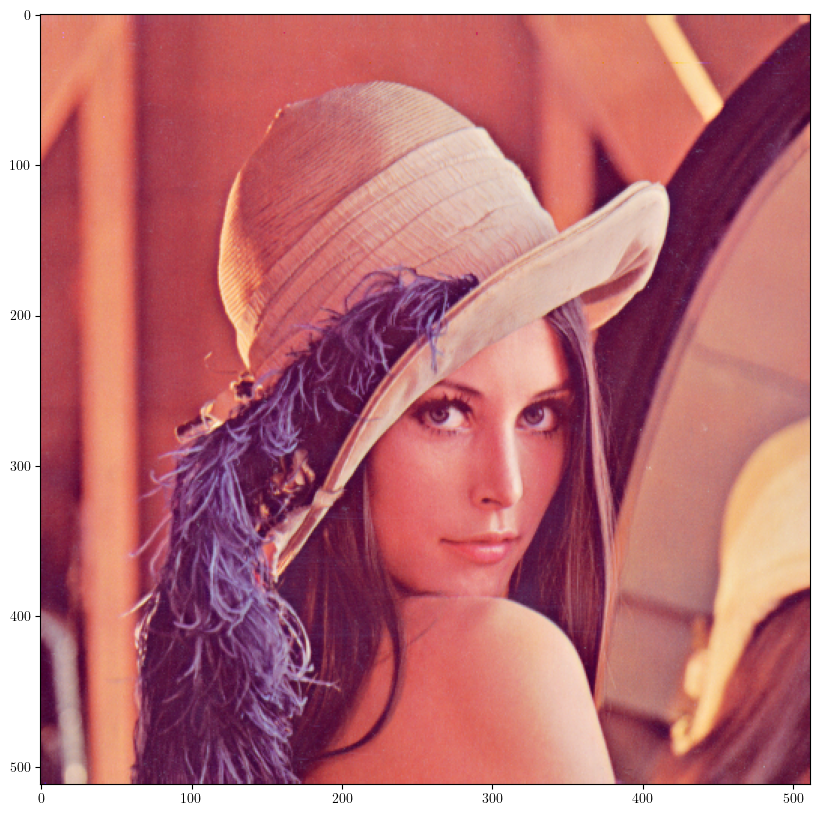

In [24]:
import urllib
from skimage import io as skimage_io

fn = "http://www.hpca.ual.es/~vruiz/images/lena.png"
req = urllib.request.Request(fn, method='HEAD')
f = urllib.request.urlopen(req)
img = skimage_io.imread(fn)
RGB_image.show(img,"")

In [55]:
row, col, ch = img.shape
mean = 0
var = 1000
sigma = var**0.5
noise = np.random.normal(mean, sigma, (row, col, ch))
print(np.max(noise))
noisy_image = np.clip(a=img.astype(np.float32) + noise, a_min=0, a_max=255).astype(np.uint8)

152.69107696046706


[image_3.py:87 print_stats() INFO] component=0 max=255 min=0 avg=178.47253799438477
[image_3.py:87 print_stats() INFO] component=1 max=255 min=0 avg=99.25044250488281
[image_3.py:87 print_stats() INFO] component=2 max=255 min=0 avg=104.95947647094727


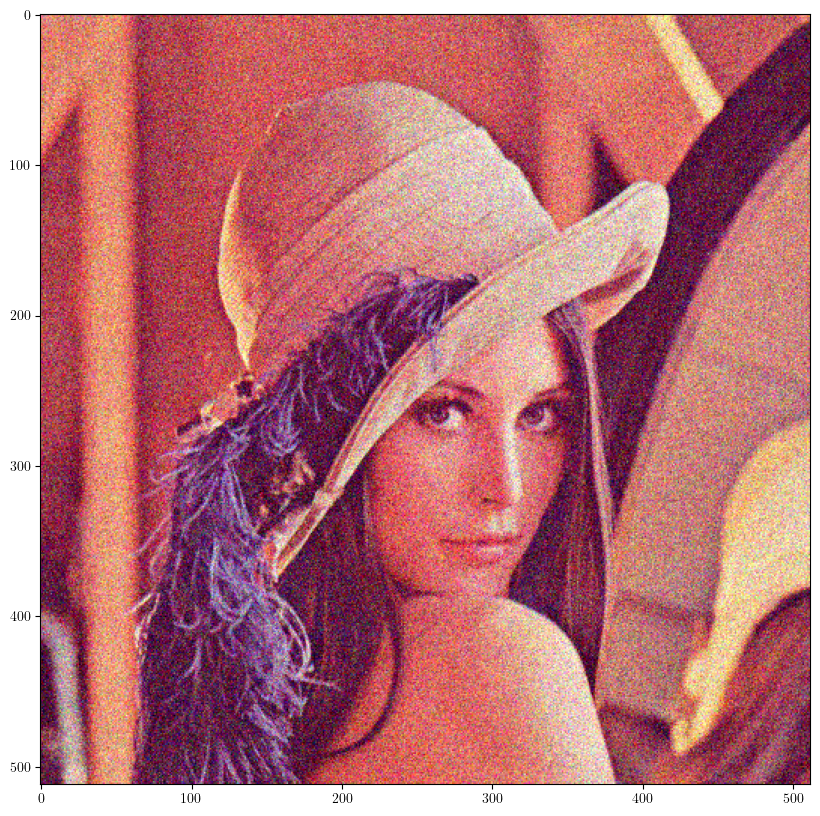

In [57]:
RGB_image.show(noisy_image,"")

In [58]:
def randomize_image(image, max_distance_x=1, max_distance_y=1):
    height, width, _ = image.shape
    x_coords, y_coords = np.meshgrid(range(width), range(height)) # Create a grid of coordinates
    flattened_x_coords = x_coords.flatten()
    flattened_y_coords = y_coords.flatten()
    displacements_x = np.random.randint(-max_distance_x, max_distance_x + 1, flattened_x_coords.shape)
    displacements_y = np.random.randint(-max_distance_y, max_distance_y + 1, flattened_y_coords.shape)
    randomized_x_coords = flattened_x_coords + displacements_x
    randomized_y_coords = flattened_y_coords + displacements_y
    randomized_x_coords = np.mod(randomized_x_coords, width) # Use periodic extension to handle border pixels
    randomized_y_coords = np.mod(randomized_y_coords, height)
    randomized_image = np.empty_like(image)
    randomized_image = image[...]
    randomized_image[randomized_y_coords,
                     randomized_x_coords, :] = image[flattened_y_coords,
                                                     flattened_x_coords, :]
    return randomized_image

def get_flow_to_project_A_to_B(A, B, l=3, w=15, prev_flow=None, sigma=1.5):
    print(A.shape, B.shape, A.dtype, B.dtype)
    flow = cv2.calcOpticalFlowFarneback(prev=B, next=A, flow=prev_flow,
                                        pyr_scale=0.5, levels=l, winsize=w,
                                        iterations=3, poly_n=5, poly_sigma=sigma,
                                        flags=0)
    #flow[...] = 0.0
    print(np.max(np.abs(flow)), l, w, sigma)
    return flow

def project_image(image, flow):
    height, width = flow.shape[:2]
    map_x = np.tile(np.arange(width), (height, 1))
    map_y = np.swapaxes(np.tile(np.arange(height), (width, 1)), 0, 1)
    map_xy = (flow + np.dstack((map_x, map_y))).astype('float32')
    warped_image = cv2.remap(image, map_xy, None,
                             #interpolation=cv2.INTER_LANCZOS4, #INTER_LINEAR,
                             interpolation=cv2.INTER_LINEAR,
                             borderMode=cv2.BORDER_REPLICATE)
    return warped_image

def project_A_to_B(A, B, l=3, w=15, prev_flow=None, sigma=1.5):
    A_luma = YUV.from_RGB(A.astype(np.int16))[..., 0]
    B_luma = YUV.from_RGB(B.astype(np.int16))[..., 0]
    flow = get_flow_to_project_A_to_B(A_luma, B_luma, l, w, prev_flow, sigma)
    return project_image(A, flow)

(512, 512) (512, 512) int16 int16
1.2937616 3 15 1.5


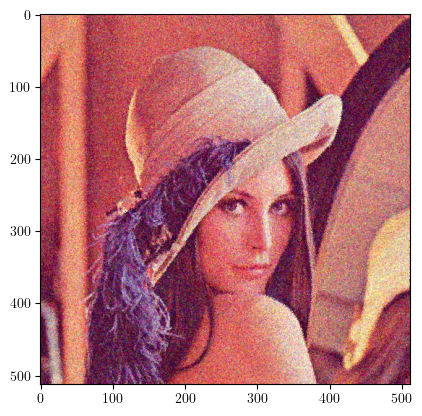

(512, 512) (512, 512) int16 int16
1.5411248 3 15 1.5


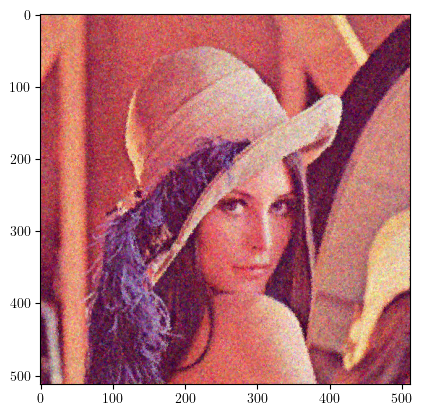

(512, 512) (512, 512) int16 int16
1.994637 3 15 1.5


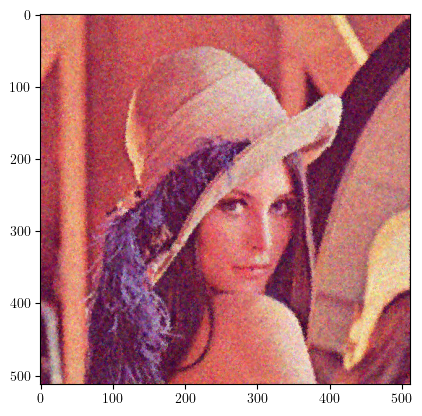

(512, 512) (512, 512) int16 int16
2.506509 3 15 1.5


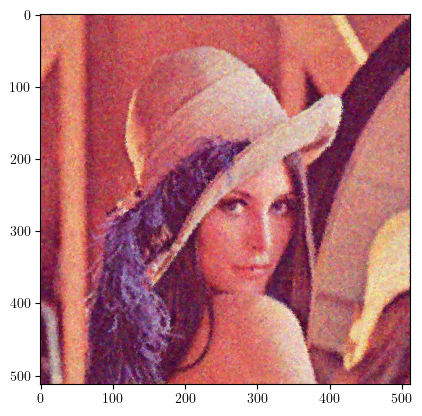

(512, 512) (512, 512) int16 int16
2.5582168 3 15 1.5


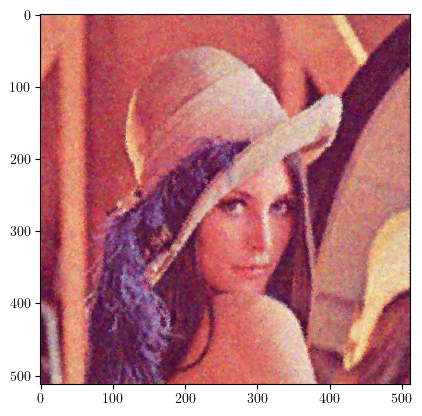

(512, 512) (512, 512) int16 int16
3.1401157 3 15 1.5


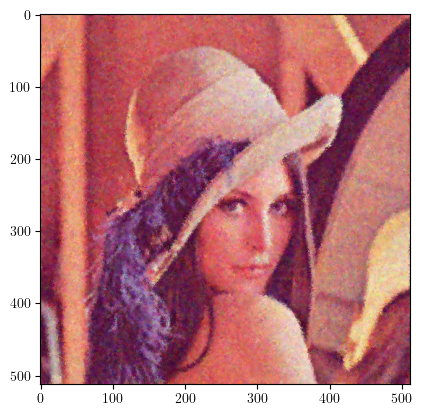

(512, 512) (512, 512) int16 int16
2.9480941 3 15 1.5


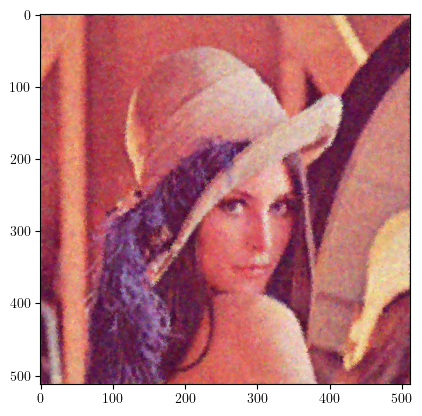

(512, 512) (512, 512) int16 int16
4.196732 3 15 1.5


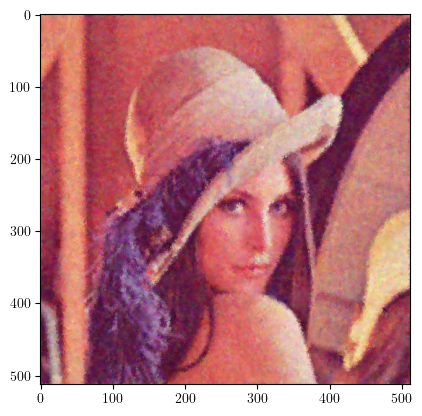

(512, 512) (512, 512) int16 int16
3.6147926 3 15 1.5


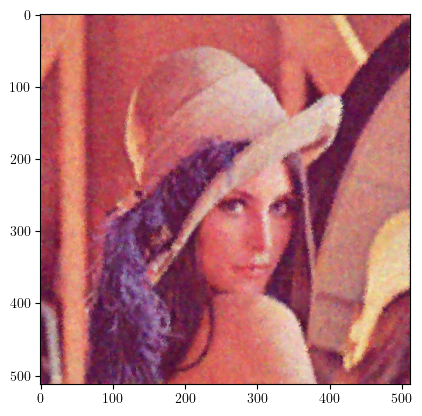

(512, 512) (512, 512) int16 int16
5.1654453 3 15 1.5


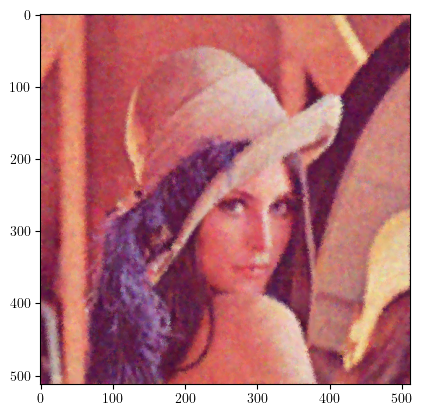

(512, 512) (512, 512) int16 int16
4.6249337 3 15 1.5


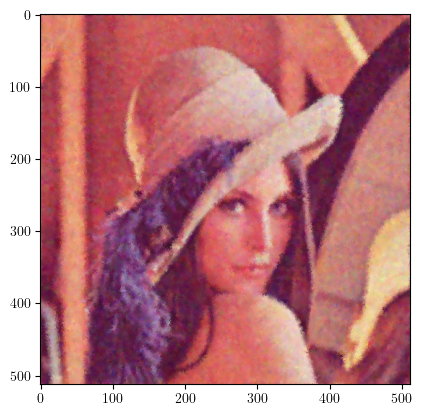

(512, 512) (512, 512) int16 int16
4.420583 3 15 1.5


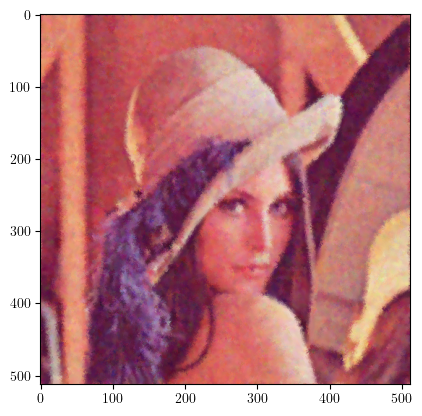

(512, 512) (512, 512) int16 int16
4.9488707 3 15 1.5


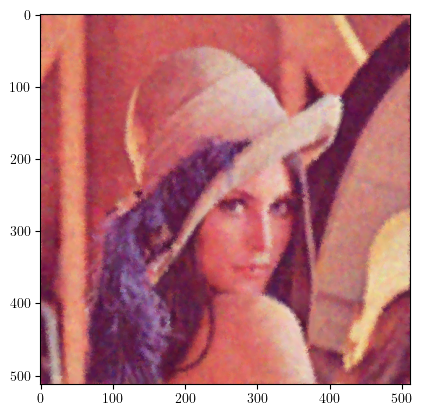

(512, 512) (512, 512) int16 int16
5.9986553 3 15 1.5


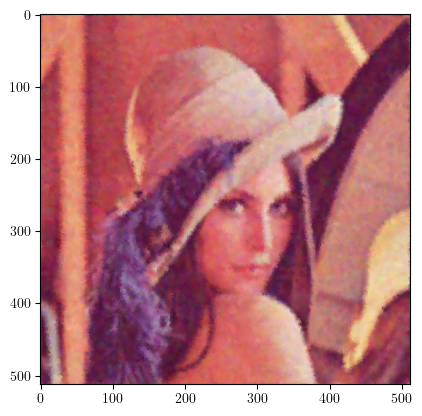

(512, 512) (512, 512) int16 int16
7.6084995 3 15 1.5


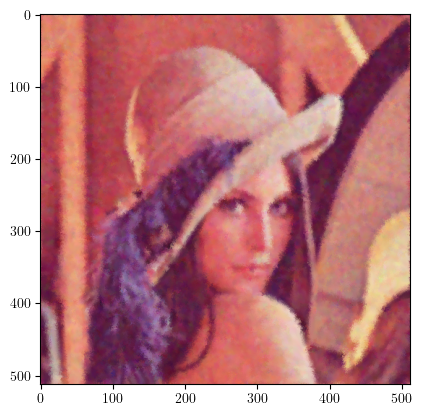

(512, 512) (512, 512) int16 int16
8.741227 3 15 1.5


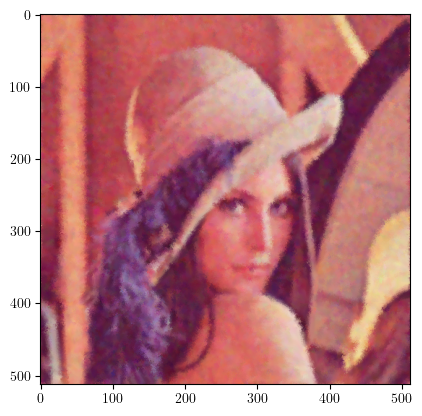

(512, 512) (512, 512) int16 int16
6.837699 3 15 1.5


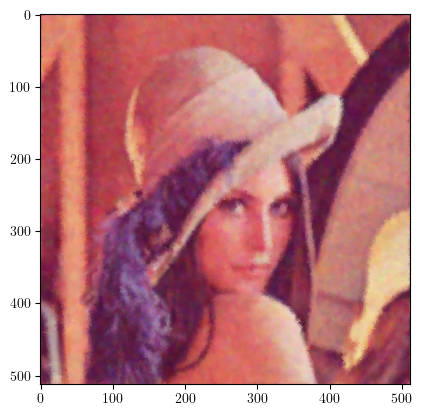

(512, 512) (512, 512) int16 int16
5.8135004 3 15 1.5


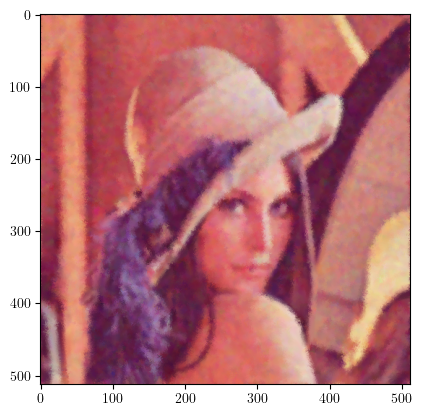

(512, 512) (512, 512) int16 int16
5.4551153 3 15 1.5


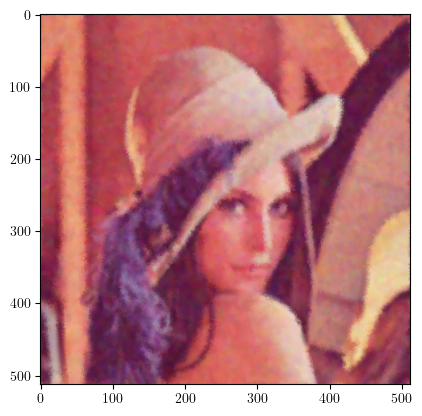

(512, 512) (512, 512) int16 int16
5.7934704 3 15 1.5


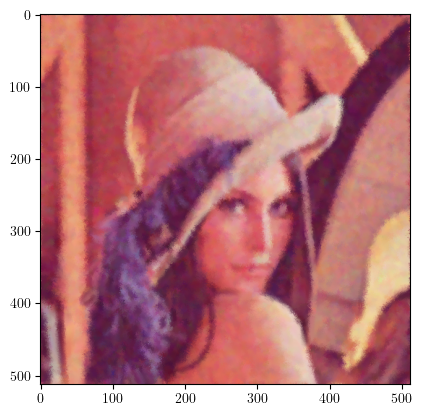

In [59]:
iters = 20
denoised_image = np.empty_like(noisy_image, dtype=np.float32)
denoised_image[...] = noisy_image
for i in range(iters):
    randomized_noisy_image = randomize_image(denoised_image)
    OF_compensated_randomized_noisy_image = project_A_to_B(A=randomized_noisy_image, B=noisy_image)
    denoised_image = (denoised_image + OF_compensated_randomized_noisy_image)/2
    plt.imshow(denoised_image.astype(np.uint8))
    plt.show()

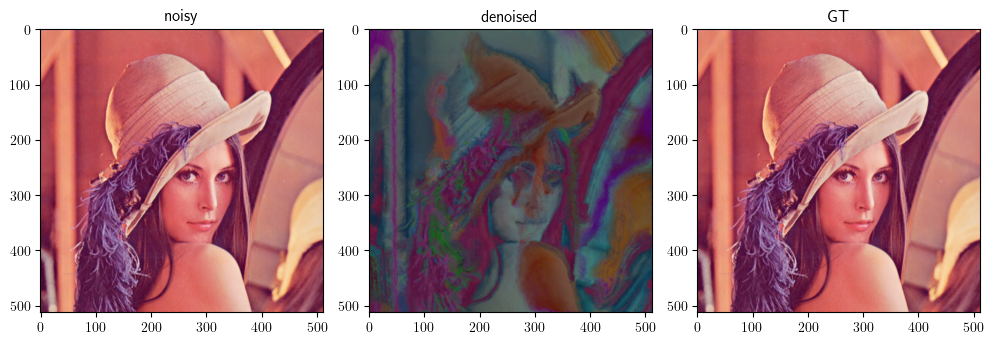

In [34]:
fig, axs = plt.subplots(1, 3, figsize=(10, 8))
axs[0].imshow(noisy_image.astype(np.uint8))
axs[0].set_title("noisy")
axs[1].imshow(denoised_image.astype(np.uint8))
axs[1].set_title("denoised")
axs[2].imshow(img.astype(np.uint8))
axs[2].set_title("GT")
fig.tight_layout()
plt.show()

[image_3.py:87 print_stats() INFO] component=0 max=125 min=4 avg=75.74764251708984
[image_3.py:87 print_stats() INFO] component=1 max=124 min=2 avg=62.7275276184082
[image_3.py:87 print_stats() INFO] component=2 max=122 min=2 avg=74.14146423339844


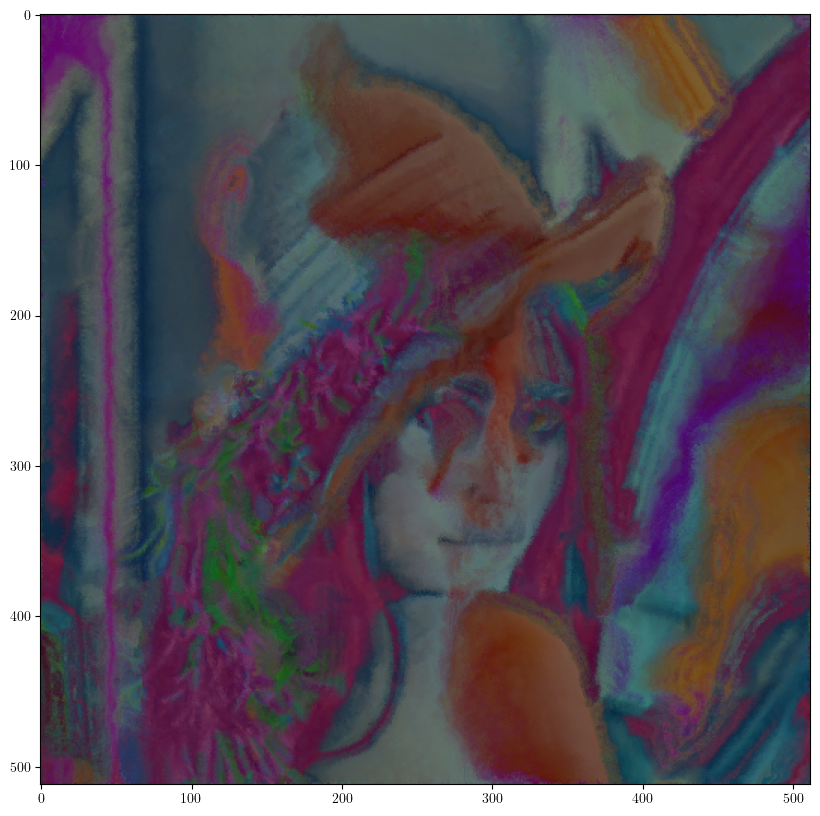

In [37]:
RGB_image.show(denoised_image.astype(np.uint8),"")